In [25]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
from white_demura import mean_pooling, run_dfs, run_dfs_green, reconstruct_mask, RGB_mask_no_roi, RGB_mask, sum_contour, read_and_extract_roi, apply_mask, get_signal_mapping, generate_mapping, extract_middle_roi
from read_images import generate_RGB_dataframes, get_signal_mapping_overlap

In [2]:
edge_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/mask_edges.png'
edge_image = cv2.imread(edge_path, cv2.IMREAD_GRAYSCALE)
edge_mask = np.where(edge_image == 255, 1, 0)

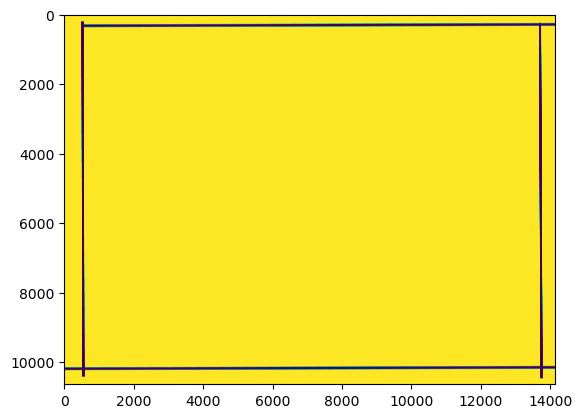

In [3]:
plt.imshow(edge_mask)
plt.show()

In [4]:
red_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp'
green_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp'
blue_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp'

clear_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp'


red_image_255 = cv2.imread(red_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
green_image_255 = cv2.imread(green_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
blue_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
clear_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask

red_image_255 = mean_pooling(red_image_255, 5).astype(np.int16)
green_image_255 = mean_pooling(green_image_255, 5).astype(np.int16)
blue_image_255 = mean_pooling(blue_image_255, 5).astype(np.int16)
clear_image_255 = mean_pooling(clear_image_255, 5).astype(np.int16)

red_binary = np.where(red_image_255 > 8, 255, 0)
green_binary = np.where(green_image_255 > 8, 255, 0)
blue_binary = np.where(blue_image_255 > 8, 255, 0)


In [164]:
blue_binary.shape

(2128, 2829)

In [5]:
red_covered_pixels_mapping = run_dfs(red_binary,3)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [6]:
green_covered_pixels_mapping = run_dfs(green_binary,5)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [7]:
blue_covered_pixels_mapping = run_dfs(blue_binary,4)

copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [8]:
red_new_df, green_new_df, blue_new_df, a = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 5, mask=edge_mask)

<Axes: xlabel='index'>

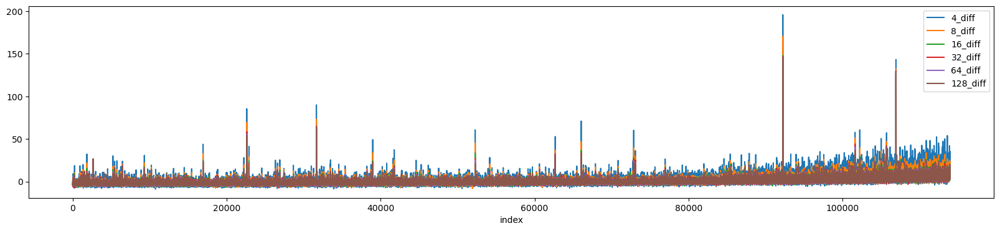

In [9]:
red_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

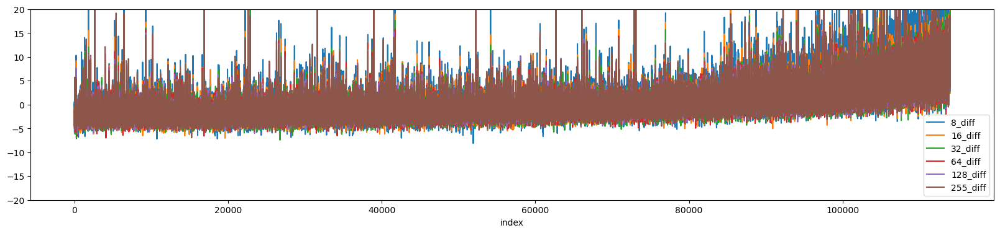

In [10]:
red_new_df.reset_index().plot(figsize=[20, 4], ylim = [-20, 20],x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

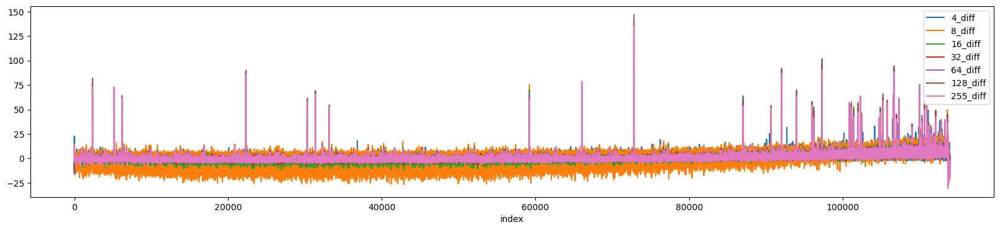

In [11]:
green_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

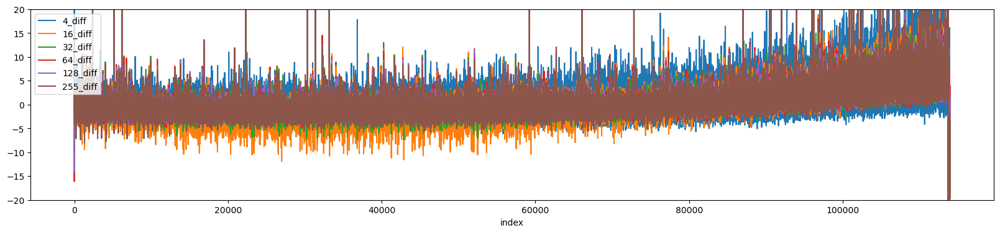

In [12]:
green_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

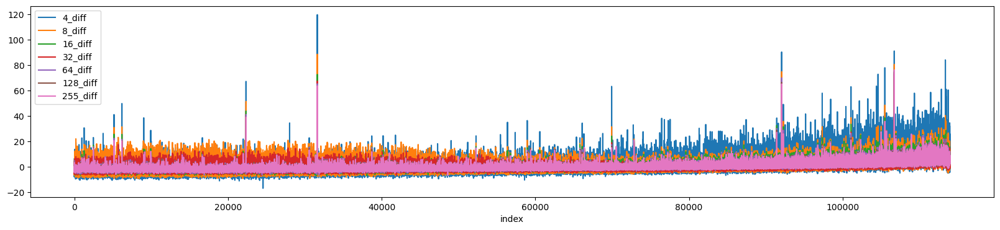

In [13]:
blue_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

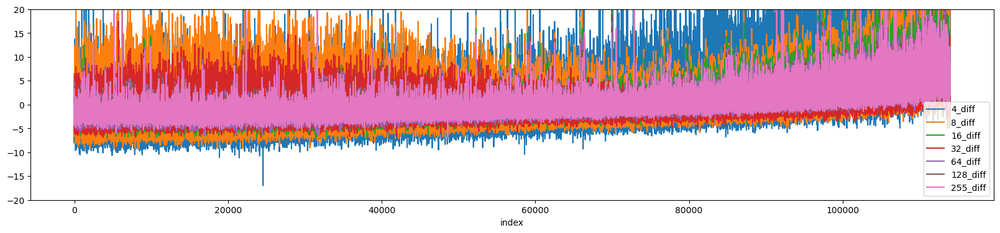

In [14]:
blue_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [15]:

red_binary = reconstruct_mask(red_binary, red_covered_pixels_mapping)

green_binary = reconstruct_mask(green_binary, green_covered_pixels_mapping)

blue_binary = reconstruct_mask(blue_binary, blue_covered_pixels_mapping)

In [16]:
red_binary.shape

(2128, 2829)

In [17]:
cv2.imwrite('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/red_image_255.png', red_image_255)

True

In [18]:
rgb_binary = np.array([red_binary, green_binary, blue_binary])
rgb_percentage = np.zeros(rgb_binary.shape)

In [19]:
def normalize(image_255, thres, max):
    norm = np.where(image_255 > thres, image_255, 0)
    norm = max * (norm / norm[norm > 0].mean())
    return norm


In [20]:
red_image_255_norm = normalize(red_image_255, 8, 200)
green_image_255_norm = normalize(green_image_255, 8, 200)
blue_image_255_norm = normalize(blue_image_255, 8, 200)

In [21]:

for row in range(0,len(rgb_binary[0])):
    for col in range(0, len(rgb_binary[0][0])):
        if (rgb_binary[0][row][col] != 0 and rgb_binary[1][row][col] != 0) or (rgb_binary[0][row][col] != 0 and rgb_binary[2][row][col] != 0) or (rgb_binary[1][row][col] != 0 and rgb_binary[2][row][col] != 0):
            sum = red_image_255_norm[row][col] + green_image_255_norm[row][col] + blue_image_255_norm[row][col]
            rgb_percentage[0][row][col] = red_image_255_norm[row][col] / sum
            rgb_percentage[1][row][col] = green_image_255_norm[row][col] / sum
            rgb_percentage[2][row][col] = blue_image_255_norm[row][col] / sum


In [22]:
rgb_percentage

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])

In [26]:

def generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, is_down_sample=False, kernal=5, overlap_percentage=None, mask=None):
    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE)

    if type(mask) == type(None):
        mask = np.ones_like(clear_image_4)

    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_clear_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_clear_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_clear_2800000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_clear_489999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_clear_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    red_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_X_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_X_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_X_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_X_3500000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_X_595000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_X_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask


    green_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Y_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Y_28000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Y_8750000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Y_2100000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Y_455000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Y_91000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp', cv2.IMREAD_GRAYSCALE) * mask


    blue_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Z_210000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Z_77000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Z_14699999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Z_4550000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Z_770000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Z_140000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    overlap_set = []
    if is_down_sample:
        clear_image_4 = mean_pooling(clear_image_4, kernal).astype(np.int16)
        clear_image_8 = mean_pooling(clear_image_8, kernal).astype(np.int16)
        clear_image_16 = mean_pooling(clear_image_16, kernal).astype(np.int16)
        clear_image_32 = mean_pooling(clear_image_32, kernal).astype(np.int16)
        clear_image_64 = mean_pooling(clear_image_64, kernal).astype(np.int16)
        clear_image_128 = mean_pooling(clear_image_128, kernal).astype(np.int16)
        clear_image_255 = mean_pooling(clear_image_255, kernal).astype(np.int16)

        red_image_4 = mean_pooling(red_image_4, kernal).astype(np.int16)
        red_image_8 = mean_pooling(red_image_8, kernal).astype(np.int16)
        red_image_16 = mean_pooling(red_image_16, kernal).astype(np.int16)
        red_image_32 = mean_pooling(red_image_32, kernal).astype(np.int16)
        red_image_64 = mean_pooling(red_image_64, kernal).astype(np.int16)
        red_image_128 = mean_pooling(red_image_128, kernal).astype(np.int16)
        red_image_255 = mean_pooling(red_image_255, kernal).astype(np.int16)


        green_image_4 = mean_pooling(green_image_4, kernal).astype(np.int16)
        green_image_8 = mean_pooling(green_image_8, kernal).astype(np.int16)
        green_image_16 = mean_pooling(green_image_16, kernal).astype(np.int16)
        green_image_32 = mean_pooling(green_image_32, kernal).astype(np.int16)
        green_image_64 = mean_pooling(green_image_64, kernal).astype(np.int16)
        green_image_128 = mean_pooling(green_image_128, kernal).astype(np.int16)
        green_image_255 = mean_pooling(green_image_255, kernal).astype(np.int16)


        blue_image_4 = mean_pooling(blue_image_4, kernal).astype(np.int16)
        blue_image_8 = mean_pooling(blue_image_8, kernal).astype(np.int16)
        blue_image_16 = mean_pooling(blue_image_16, kernal).astype(np.int16)
        blue_image_32 = mean_pooling(blue_image_32, kernal).astype(np.int16)
        blue_image_64 = mean_pooling(blue_image_64, kernal).astype(np.int16)
        blue_image_128 = mean_pooling(blue_image_128, kernal).astype(np.int16)
        blue_image_255 = mean_pooling(blue_image_255, kernal).astype(np.int16)
    
    if overlap_percentage is not None:
        print('overlap_percentage loading....')
        red_signal_map_4, a = get_signal_mapping_overlap(clear_image_4, red_covered_pixels_mapping, overlap_percentage[0])
        overlap_set = overlap_set + (a)
        red_signal_map_8 = get_signal_mapping_overlap(clear_image_8, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_16 = get_signal_mapping_overlap(clear_image_16, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_32 = get_signal_mapping_overlap(clear_image_32, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_64 = get_signal_mapping_overlap(clear_image_64, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_128 = get_signal_mapping_overlap(clear_image_128, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_255 = get_signal_mapping_overlap(clear_image_255, red_covered_pixels_mapping, overlap_percentage[0])[0]

        green_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, green_covered_pixels_mapping, overlap_percentage[1])
        overlap_set = overlap_set + (a)
        green_signal_map_8 = get_signal_mapping_overlap(clear_image_8, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_16 = get_signal_mapping_overlap(clear_image_16, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_32 = get_signal_mapping_overlap(clear_image_32, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_64 = get_signal_mapping_overlap(clear_image_64, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_128 = get_signal_mapping_overlap(clear_image_128, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_255 = get_signal_mapping_overlap(clear_image_255, green_covered_pixels_mapping, overlap_percentage[1])[0]

        blue_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, blue_covered_pixels_mapping, overlap_percentage[2])
        overlap_set = overlap_set + (a)
        blue_signal_map_8 = get_signal_mapping_overlap(clear_image_8, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_16 = get_signal_mapping_overlap(clear_image_16, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_32 = get_signal_mapping_overlap(clear_image_32, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_64 = get_signal_mapping_overlap(clear_image_64, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_128 = get_signal_mapping_overlap(clear_image_128, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_255 = get_signal_mapping_overlap(clear_image_255, blue_covered_pixels_mapping, overlap_percentage[2])[0]

    else:
        red_signal_map_4 = get_signal_mapping(clear_image_4, red_covered_pixels_mapping)
        red_signal_map_8 = get_signal_mapping(clear_image_8, red_covered_pixels_mapping)
        red_signal_map_16 = get_signal_mapping(clear_image_16, red_covered_pixels_mapping)
        red_signal_map_32 = get_signal_mapping(clear_image_32, red_covered_pixels_mapping)
        red_signal_map_64 = get_signal_mapping(clear_image_64, red_covered_pixels_mapping)
        red_signal_map_128 = get_signal_mapping(clear_image_128, red_covered_pixels_mapping)
        red_signal_map_255 = get_signal_mapping(clear_image_255, red_covered_pixels_mapping)

        green_signal_map_4 = get_signal_mapping(clear_image_4, green_covered_pixels_mapping)
        green_signal_map_8 = get_signal_mapping(clear_image_8, green_covered_pixels_mapping)
        green_signal_map_16 = get_signal_mapping(clear_image_16, green_covered_pixels_mapping)
        green_signal_map_32 = get_signal_mapping(clear_image_32, green_covered_pixels_mapping)
        green_signal_map_64 = get_signal_mapping(clear_image_64, green_covered_pixels_mapping)
        green_signal_map_128 = get_signal_mapping(clear_image_128, green_covered_pixels_mapping)
        green_signal_map_255 = get_signal_mapping(clear_image_255, green_covered_pixels_mapping)

        blue_signal_map_4 = get_signal_mapping(clear_image_4, blue_covered_pixels_mapping)
        blue_signal_map_8 = get_signal_mapping(clear_image_8, blue_covered_pixels_mapping)
        blue_signal_map_16 = get_signal_mapping(clear_image_16, blue_covered_pixels_mapping)
        blue_signal_map_32 = get_signal_mapping(clear_image_32, blue_covered_pixels_mapping)
        blue_signal_map_64 = get_signal_mapping(clear_image_64, blue_covered_pixels_mapping)
        blue_signal_map_128 = get_signal_mapping(clear_image_128, blue_covered_pixels_mapping)
        blue_signal_map_255 = get_signal_mapping(clear_image_255, blue_covered_pixels_mapping)

    red_signal_map_ground_truth_4 = get_signal_mapping(red_image_4, red_covered_pixels_mapping)
    red_signal_map_ground_truth_8 = get_signal_mapping(red_image_8, red_covered_pixels_mapping)
    red_signal_map_ground_truth_16 = get_signal_mapping(red_image_16, red_covered_pixels_mapping)
    red_signal_map_ground_truth_32 = get_signal_mapping(red_image_32, red_covered_pixels_mapping)
    red_signal_map_ground_truth_64 = get_signal_mapping(red_image_64, red_covered_pixels_mapping)
    red_signal_map_ground_truth_128 = get_signal_mapping(red_image_128, red_covered_pixels_mapping)
    red_signal_map_ground_truth_255 = get_signal_mapping(red_image_255, red_covered_pixels_mapping)

    green_signal_map_ground_truth_4 = get_signal_mapping(green_image_4, green_covered_pixels_mapping)
    green_signal_map_ground_truth_8 = get_signal_mapping(green_image_8, green_covered_pixels_mapping)
    green_signal_map_ground_truth_16 = get_signal_mapping(green_image_16, green_covered_pixels_mapping)
    green_signal_map_ground_truth_32 = get_signal_mapping(green_image_32, green_covered_pixels_mapping)
    green_signal_map_ground_truth_64 = get_signal_mapping(green_image_64, green_covered_pixels_mapping)
    green_signal_map_ground_truth_128 = get_signal_mapping(green_image_128, green_covered_pixels_mapping)
    green_signal_map_ground_truth_255 = get_signal_mapping(green_image_255, green_covered_pixels_mapping)

    blue_signal_map_ground_truth_4 = get_signal_mapping(blue_image_4, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_8 = get_signal_mapping(blue_image_8, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_16 = get_signal_mapping(blue_image_16, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_32 = get_signal_mapping(blue_image_32, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_64 = get_signal_mapping(blue_image_64, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_128 = get_signal_mapping(blue_image_128, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_255 = get_signal_mapping(blue_image_255, blue_covered_pixels_mapping)


    red_df = pd.DataFrame()
    green_df = pd.DataFrame()
    blue_df = pd.DataFrame()

    red_df["4_ground_truth_mapping"] = red_signal_map_ground_truth_4.values()
    red_df["8_ground_truth_mapping"] = red_signal_map_ground_truth_8.values()
    red_df["16_ground_truth_mapping"] = red_signal_map_ground_truth_16.values()
    red_df["32_ground_truth_mapping"] = red_signal_map_ground_truth_32.values()
    red_df["64_ground_truth_mapping"] = red_signal_map_ground_truth_64.values()
    red_df["128_ground_truth_mapping"] = red_signal_map_ground_truth_128.values()
    red_df["255_ground_truth_mapping"] = red_signal_map_ground_truth_255.values()

    red_df["4_mapping"] = red_signal_map_4.values()
    red_df["8_mapping"] = red_signal_map_8.values()
    red_df["16_mapping"] = red_signal_map_16.values()
    red_df["32_mapping"] = red_signal_map_32.values()
    red_df["64_mapping"] = red_signal_map_64.values()
    red_df["128_mapping"] = red_signal_map_128.values()
    red_df["255_mapping"] = red_signal_map_255.values()

    red_df["4_diff"] = red_df["4_ground_truth_mapping"] - red_df["4_mapping"]
    red_df["8_diff"] = red_df["8_ground_truth_mapping"] - red_df["8_mapping"]
    red_df["16_diff"] = red_df["16_ground_truth_mapping"] - red_df["16_mapping"]
    red_df["32_diff"] = red_df["32_ground_truth_mapping"] - red_df["32_mapping"]
    red_df["64_diff"] = red_df["64_ground_truth_mapping"] - red_df["64_mapping"]
    red_df["128_diff"] = red_df["128_ground_truth_mapping"] - red_df["128_mapping"]
    red_df["255_diff"] = red_df["255_ground_truth_mapping"] - red_df["255_mapping"]

    red_df["4_to_gt_ratio"] = red_df["4_mapping"] / red_df["4_ground_truth_mapping"]
    red_df["8_to_gt_ratio"] = red_df["8_mapping"] / red_df["8_ground_truth_mapping"] 
    red_df["16_to_gt_ratio"] = red_df["16_mapping"] / red_df["16_ground_truth_mapping"]
    red_df["32_to_gt_ratio"] = red_df["32_mapping"] / red_df["32_ground_truth_mapping"]
    red_df["64_to_gt_ratio"] = red_df["64_mapping"] / red_df["64_ground_truth_mapping"]
    red_df["128_to_gt_ratio"] = red_df["128_mapping"] / red_df["128_ground_truth_mapping"]
    red_df["255_to_gt_ratio"] = red_df["255_mapping"] / red_df["255_ground_truth_mapping"]

    red_df["4_diff_percentage"] = ((red_df['4_to_gt_ratio'].mean() - 1) * 100)
    red_df["8_diff_percentage"] = ((red_df['8_to_gt_ratio'].mean() - 1) * 100)
    red_df["16_diff_percentage"] = ((red_df['16_to_gt_ratio'].mean() - 1) * 100)
    red_df["32_diff_percentage"] = ((red_df['32_to_gt_ratio'].mean() - 1) * 100)
    red_df["64_diff_percentage"] = ((red_df['64_to_gt_ratio'].mean() - 1) * 100)
    red_df["128_diff_percentage"] = ((red_df['128_to_gt_ratio'].mean() - 1) * 100)
    red_df["255_diff_percentage"] = ((red_df['255_to_gt_ratio'].mean() - 1) * 100)

    red_df['4_normalized'] = red_df['4_to_gt_ratio'].mean() * red_df["4_ground_truth_mapping"]
    red_df['8_normalized'] = red_df['8_to_gt_ratio'].mean() * red_df["8_ground_truth_mapping"]
    red_df['16_normalized'] = red_df['16_to_gt_ratio'].mean() * red_df["16_ground_truth_mapping"]
    red_df['32_normalized'] = red_df['32_to_gt_ratio'].mean() * red_df["32_ground_truth_mapping"]
    red_df['64_normalized'] = red_df['64_to_gt_ratio'].mean() * red_df["64_ground_truth_mapping"]
    red_df['128_normalized'] = red_df['128_to_gt_ratio'].mean() * red_df["128_ground_truth_mapping"]
    red_df['255_normalized'] = red_df['255_to_gt_ratio'].mean() * red_df["255_ground_truth_mapping"]




    green_df["4_ground_truth_mapping"] = green_signal_map_ground_truth_4.values()
    green_df["8_ground_truth_mapping"] = green_signal_map_ground_truth_8.values()
    green_df["16_ground_truth_mapping"] = green_signal_map_ground_truth_16.values()
    green_df["32_ground_truth_mapping"] = green_signal_map_ground_truth_32.values()
    green_df["64_ground_truth_mapping"] = green_signal_map_ground_truth_64.values()
    green_df["128_ground_truth_mapping"] = green_signal_map_ground_truth_128.values()
    green_df["255_ground_truth_mapping"] = green_signal_map_ground_truth_255.values()

    green_df["4_mapping"] = green_signal_map_4.values()
    green_df["8_mapping"] = green_signal_map_8.values()
    green_df["16_mapping"] = green_signal_map_16.values()
    green_df["32_mapping"] = green_signal_map_32.values()
    green_df["64_mapping"] = green_signal_map_64.values()
    green_df["128_mapping"] = green_signal_map_128.values()
    green_df["255_mapping"] = green_signal_map_255.values()

    green_df["4_diff"] = green_df["4_ground_truth_mapping"] - green_df["4_mapping"]
    green_df["8_diff"] = green_df["8_ground_truth_mapping"] - green_df["8_mapping"]
    green_df["16_diff"] = green_df["16_ground_truth_mapping"] - green_df["16_mapping"]
    green_df["32_diff"] = green_df["32_ground_truth_mapping"] - green_df["32_mapping"]
    green_df["64_diff"] = green_df["64_ground_truth_mapping"] - green_df["64_mapping"]
    green_df["128_diff"] = green_df["128_ground_truth_mapping"] - green_df["128_mapping"]
    green_df["255_diff"] = green_df["255_ground_truth_mapping"] - green_df["255_mapping"]

    green_df["4_to_gt_ratio"] = green_df["4_mapping"] / green_df["4_ground_truth_mapping"]
    green_df["8_to_gt_ratio"] = green_df["8_mapping"] / green_df["8_ground_truth_mapping"] 
    green_df["16_to_gt_ratio"] = green_df["16_mapping"] / green_df["16_ground_truth_mapping"]
    green_df["32_to_gt_ratio"] = green_df["32_mapping"] / green_df["32_ground_truth_mapping"]
    green_df["64_to_gt_ratio"] = green_df["64_mapping"] / green_df["64_ground_truth_mapping"]
    green_df["128_to_gt_ratio"] = green_df["128_mapping"] / green_df["128_ground_truth_mapping"]
    green_df["255_to_gt_ratio"] = green_df["255_mapping"] / green_df["255_ground_truth_mapping"]

    green_df["4_diff_percentage"] = ((green_df['4_to_gt_ratio'].mean() - 1) * 100)
    green_df["8_diff_percentage"] = ((green_df['8_to_gt_ratio'].mean() - 1) * 100)
    green_df["16_diff_percentage"] = ((green_df['16_to_gt_ratio'].mean() - 1) * 100)
    green_df["32_diff_percentage"] = ((green_df['32_to_gt_ratio'].mean() - 1) * 100)
    green_df["64_diff_percentage"] = ((green_df['64_to_gt_ratio'].mean() - 1) * 100)
    green_df["128_diff_percentage"] = ((green_df['128_to_gt_ratio'].mean() - 1) * 100)
    green_df["255_diff_percentage"] = ((green_df['255_to_gt_ratio'].mean() - 1) * 100)

    green_df['4_normalized'] = green_df['4_to_gt_ratio'].mean() * green_df["4_ground_truth_mapping"]
    green_df['8_normalized'] = green_df['8_to_gt_ratio'].mean() * green_df["8_ground_truth_mapping"]
    green_df['16_normalized'] = green_df['16_to_gt_ratio'].mean() * green_df["16_ground_truth_mapping"]
    green_df['32_normalized'] = green_df['32_to_gt_ratio'].mean() * green_df["32_ground_truth_mapping"]
    green_df['64_normalized'] = green_df['64_to_gt_ratio'].mean() * green_df["64_ground_truth_mapping"]
    green_df['128_normalized'] = green_df['128_to_gt_ratio'].mean() * green_df["128_ground_truth_mapping"]
    green_df['255_normalized'] = green_df['255_to_gt_ratio'].mean() * green_df["255_ground_truth_mapping"]



    blue_df["4_ground_truth_mapping"] = blue_signal_map_ground_truth_4.values()
    blue_df["8_ground_truth_mapping"] = blue_signal_map_ground_truth_8.values()
    blue_df["16_ground_truth_mapping"] = blue_signal_map_ground_truth_16.values()
    blue_df["32_ground_truth_mapping"] = blue_signal_map_ground_truth_32.values()
    blue_df["64_ground_truth_mapping"] = blue_signal_map_ground_truth_64.values()
    blue_df["128_ground_truth_mapping"] = blue_signal_map_ground_truth_128.values()
    blue_df["255_ground_truth_mapping"] = blue_signal_map_ground_truth_255.values()

    blue_df["4_mapping"] = blue_signal_map_4.values()
    blue_df["8_mapping"] = blue_signal_map_8.values()
    blue_df["16_mapping"] = blue_signal_map_16.values()
    blue_df["32_mapping"] = blue_signal_map_32.values()
    blue_df["64_mapping"] = blue_signal_map_64.values()
    blue_df["128_mapping"] = blue_signal_map_128.values()
    blue_df["255_mapping"] = blue_signal_map_255.values()

    blue_df["4_diff"] = blue_df["4_ground_truth_mapping"] - blue_df["4_mapping"]
    blue_df["8_diff"] = blue_df["8_ground_truth_mapping"] - blue_df["8_mapping"]
    blue_df["16_diff"] = blue_df["16_ground_truth_mapping"] - blue_df["16_mapping"]
    blue_df["32_diff"] = blue_df["32_ground_truth_mapping"] - blue_df["32_mapping"]
    blue_df["64_diff"] = blue_df["64_ground_truth_mapping"] - blue_df["64_mapping"]
    blue_df["128_diff"] = blue_df["128_ground_truth_mapping"] - blue_df["128_mapping"]
    blue_df["255_diff"] = blue_df["255_ground_truth_mapping"] - blue_df["255_mapping"]

    blue_df["4_to_gt_ratio"] = blue_df["4_mapping"] / blue_df["4_ground_truth_mapping"]
    blue_df["8_to_gt_ratio"] = blue_df["8_mapping"] / blue_df["8_ground_truth_mapping"] 
    blue_df["16_to_gt_ratio"] = blue_df["16_mapping"] / blue_df["16_ground_truth_mapping"]
    blue_df["32_to_gt_ratio"] = blue_df["32_mapping"] / blue_df["32_ground_truth_mapping"]
    blue_df["64_to_gt_ratio"] = blue_df["64_mapping"] / blue_df["64_ground_truth_mapping"]
    blue_df["128_to_gt_ratio"] = blue_df["128_mapping"] / blue_df["128_ground_truth_mapping"]
    blue_df["255_to_gt_ratio"] = blue_df["255_mapping"] / blue_df["255_ground_truth_mapping"]

    blue_df["4_diff_percentage"] = ((blue_df['4_to_gt_ratio'].mean() - 1) * 100)
    blue_df["8_diff_percentage"] = ((blue_df['8_to_gt_ratio'].mean() - 1) * 100)
    blue_df["16_diff_percentage"] = ((blue_df['16_to_gt_ratio'].mean() - 1) * 100)
    blue_df["32_diff_percentage"] = ((blue_df['32_to_gt_ratio'].mean() - 1) * 100)
    blue_df["64_diff_percentage"] = ((blue_df['64_to_gt_ratio'].mean() - 1) * 100)
    blue_df["128_diff_percentage"] = ((blue_df['128_to_gt_ratio'].mean() - 1) * 100)
    blue_df["255_diff_percentage"] = ((blue_df['255_to_gt_ratio'].mean() - 1) * 100)

    blue_df['4_normalized'] = blue_df['4_to_gt_ratio'].mean() * blue_df["4_ground_truth_mapping"]
    blue_df['8_normalized'] = blue_df['8_to_gt_ratio'].mean() * blue_df["8_ground_truth_mapping"]
    blue_df['16_normalized'] = blue_df['16_to_gt_ratio'].mean() * blue_df["16_ground_truth_mapping"]
    blue_df['32_normalized'] = blue_df['32_to_gt_ratio'].mean() * blue_df["32_ground_truth_mapping"]
    blue_df['64_normalized'] = blue_df['64_to_gt_ratio'].mean() * blue_df["64_ground_truth_mapping"]
    blue_df['128_normalized'] = blue_df['128_to_gt_ratio'].mean() * blue_df["128_ground_truth_mapping"]
    blue_df['255_normalized'] = blue_df['255_to_gt_ratio'].mean() * blue_df["255_ground_truth_mapping"]


    red_new_df = pd.DataFrame()

    red_new_df['4_diff'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - (red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))/((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))
    red_new_df['8_diff'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - (red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))/((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))
    red_new_df['16_diff'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - (red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))/((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))
    red_new_df['32_diff'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - (red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))/((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))
    red_new_df['64_diff'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - (red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))/((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))
    red_new_df['128_diff'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - (red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))/((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))
    red_new_df['255_diff'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - (red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))/((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))

    red_new_df['A-1_4'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - 1)
    red_new_df['A-1_8'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - 1)
    red_new_df['A-1_16'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - 1)
    red_new_df['A-1_32'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - 1)
    red_new_df['A-1_64'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - 1)
    red_new_df['A-1_128'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - 1)
    red_new_df['A-1_255'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - 1)

    red_new_df['B-1_4'] = 100 * ((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_8'] = 100 * ((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_16'] = 100 * ((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_32'] = 100 * ((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_64'] = 100 * ((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_128'] = 100 * ((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_255'] = 100 * ((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()) - 1)


    green_new_df = pd.DataFrame()

    green_new_df['4_diff'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - (green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))/((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))
    green_new_df['8_diff'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - (green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))/((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))
    green_new_df['16_diff'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - (green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))/((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))
    green_new_df['32_diff'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - (green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))/((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))
    green_new_df['64_diff'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - (green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))/((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))
    green_new_df['128_diff'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - (green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))/((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))
    green_new_df['255_diff'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - (green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))/((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))

    green_new_df['A-1_4'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - 1)
    green_new_df['A-1_8'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - 1)
    green_new_df['A-1_16'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - 1)
    green_new_df['A-1_32'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - 1)
    green_new_df['A-1_64'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - 1)
    green_new_df['A-1_128'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - 1)
    green_new_df['A-1_255'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - 1)

    green_new_df['B-1_4'] = 100 * ((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_8'] = 100 * ((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_16'] = 100 * ((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_32'] = 100 * ((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_64'] = 100 * ((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_128'] = 100 * ((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_255'] = 100 * ((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()) - 1)


    blue_new_df = pd.DataFrame()

    blue_new_df['4_diff'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - (blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))/((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))
    blue_new_df['8_diff'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - (blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))/((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))
    blue_new_df['16_diff'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - (blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))/((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))
    blue_new_df['32_diff'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - (blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))/((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))
    blue_new_df['64_diff'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - (blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))/((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))
    blue_new_df['128_diff'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - (blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))/((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))
    blue_new_df['255_diff'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - (blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))/((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))

    blue_new_df['A-1_4'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - 1)
    blue_new_df['A-1_8'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - 1)
    blue_new_df['A-1_16'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - 1)
    blue_new_df['A-1_32'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - 1)
    blue_new_df['A-1_64'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - 1)
    blue_new_df['A-1_128'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - 1)
    blue_new_df['A-1_255'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - 1)

    blue_new_df['B-1_4'] = 100 * ((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_8'] = 100 * ((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_16'] = 100 * ((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_32'] = 100 * ((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_64'] = 100 * ((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_128'] = 100 * ((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_255'] = 100 * ((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()) - 1)

    return red_new_df, green_new_df, blue_new_df, overlap_set




In [27]:
red_ol_new_df, green_ol_new_df, blue_ol_new_df, idxx  = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 5, mask=edge_mask, overlap_percentage=rgb_percentage)

overlap_percentage loading....


<Axes: xlabel='index'>

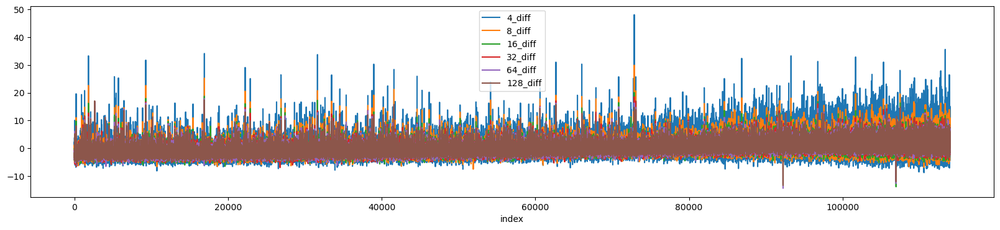

In [28]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

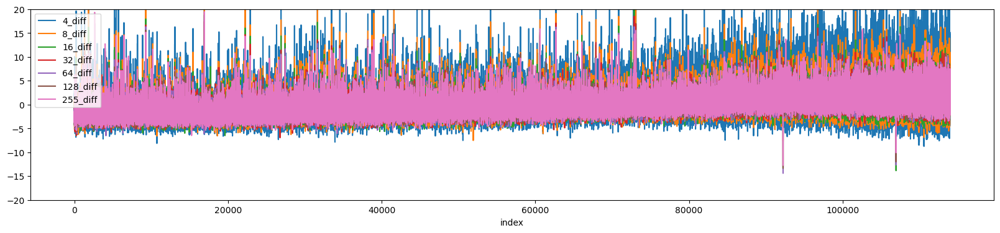

In [29]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

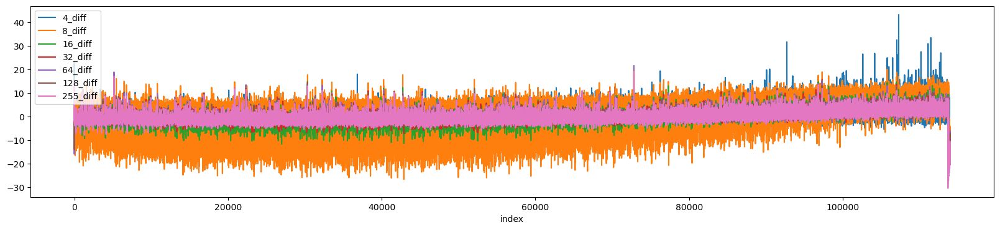

In [30]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

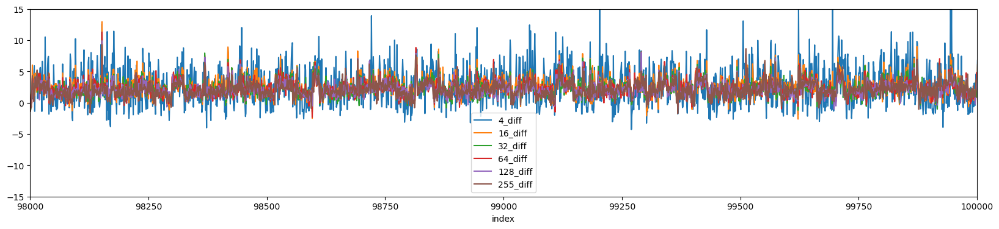

In [172]:
green_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

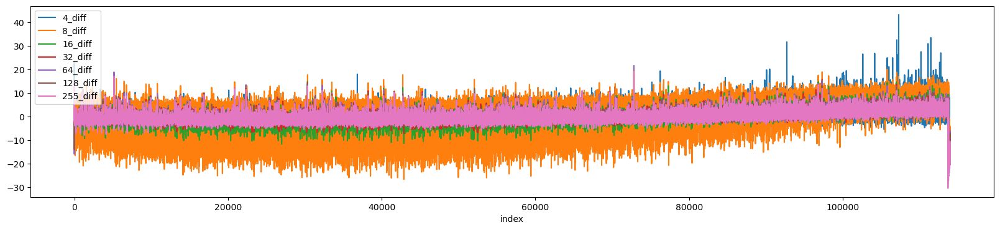

In [31]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

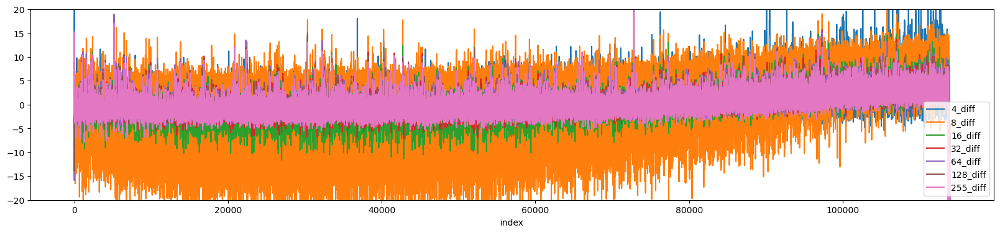

In [32]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

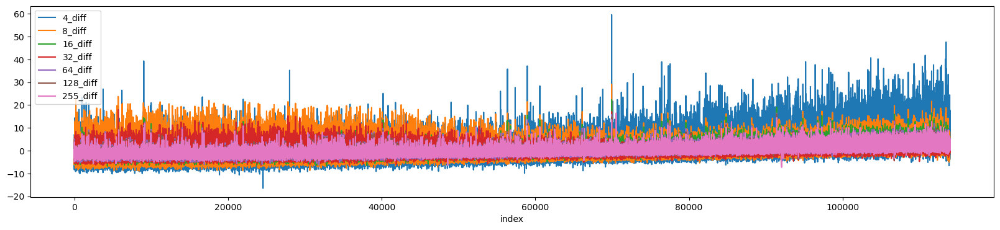

In [33]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

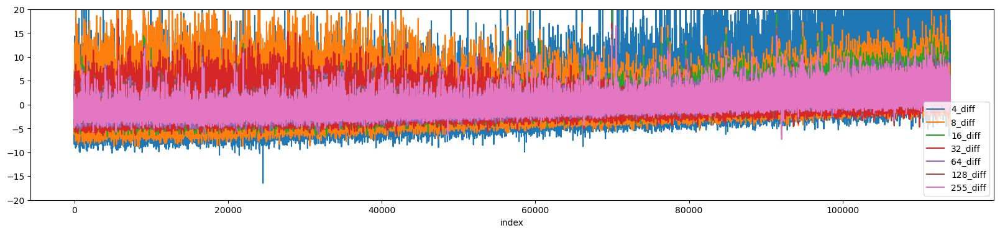

In [34]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

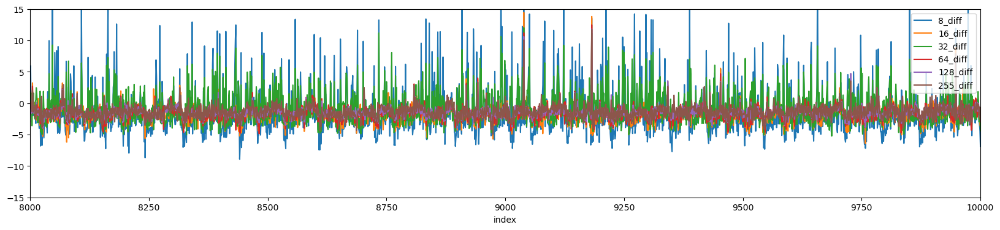

In [174]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [8000, 10000], x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [35]:
len(idxx)

38537

In [36]:
red_new_df.iloc[idxx].reset_index().reset_index()

,level_0,index,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,0,183,-3.530876,-2.500272,-1.083045,-2.679157,-2.770232,-2.175453,-0.073242,28.554646,...,2.993056,-1.013435,-2.438940,33.259887,25.248036,15.045517,10.615815,5.927493,1.187859,-2.367432
1,1,184,-1.865794,-1.390161,-1.638007,-1.753737,-1.960999,-2.156009,-1.077512,-4.004128,...,-5.555775,-3.669604,0.690377,-2.178990,-6.216219,-5.593199,-4.989736,-3.666679,-1.546948,1.787145
2,2,185,-2.049853,-3.083303,-2.128307,-2.202213,-2.732026,-2.699818,-2.524276,8.179155,...,-2.299077,-1.898825,-2.807095,10.443076,3.527550,1.763175,0.671101,0.445109,0.823218,-0.290143
3,3,481,-3.588003,-3.135744,-2.278515,-1.519076,-2.074251,-1.967744,-0.938547,4.608193,...,-4.130970,-4.377916,-2.254863,8.501220,4.136536,-0.688949,-1.929824,-2.100284,-2.458550,-1.328788
4,4,836,9.294894,4.056313,3.239935,2.699762,2.162817,1.093080,2.466644,-28.370695,...,-18.786108,-14.294280,-7.409032,-34.462351,-30.169652,-27.866665,-25.032158,-20.505430,-15.220983,-9.637942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38532,38532,113976,13.792481,9.372867,8.166527,7.217598,5.520064,5.342781,5.590928,-14.927072,...,-3.927426,-0.128046,4.187848,-25.238533,-20.831873,-17.853822,-13.098502,-8.953264,-5.193357,-1.328788
38533,38533,113977,6.182183,5.478209,4.489325,5.572483,5.495224,5.659221,7.078179,26.033967,...,11.541887,9.611241,6.396778,18.695965,17.128228,13.615111,9.391850,5.731694,3.740346,-0.636358
38534,38534,113978,7.669968,8.518108,5.621305,6.864916,6.899411,6.006716,6.337153,-32.571828,...,-3.927426,-2.784215,-2.254863,-37.375135,-24.485787,-16.219073,-12.333524,-10.128060,-8.292805,-8.079976
38535,38535,113979,16.586562,10.510227,7.659755,7.488689,6.825704,6.459997,7.065490,1.877457,...,6.046210,5.007214,8.237553,-12.616467,-6.622210,-5.797543,-2.541806,-0.729688,-1.364628,1.094716


<Axes: xlabel='level_0'>

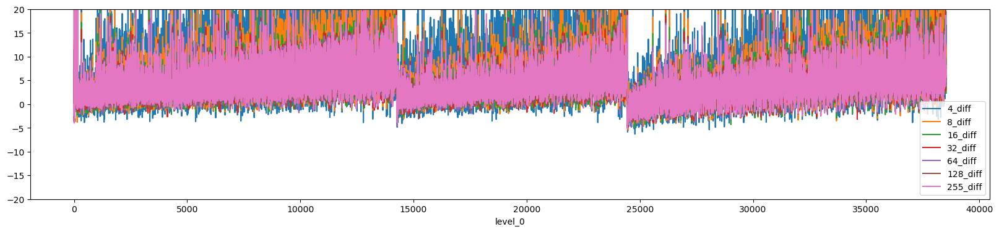

In [37]:
red_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

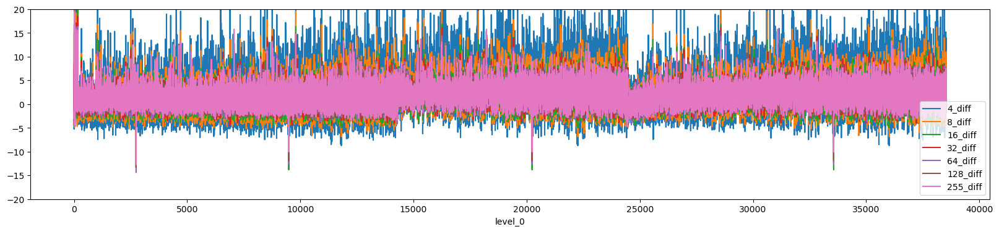

In [38]:
red_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [39]:
green_new_df

,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,A-1_8,A-1_16,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,2.224225,-2.284746,-4.249432,-9.023101,-10.635891,-10.289094,6.793806,-68.758229,-71.521419,-73.311008,...,-74.283268,-74.990929,-73.842044,-69.437997,-70.855542,-72.126544,-71.412257,-71.222527,-72.122597,-75.506111
1,-2.595111,-5.417782,-8.658998,-10.460203,-14.094254,-11.930147,1.541651,-73.965191,-75.558613,-76.647132,...,-76.651914,-76.453448,-75.128501,-73.271558,-74.158581,-74.433313,-73.873454,-72.821276,-73.263777,-75.506111
2,-1.379834,-5.175512,-5.576554,-10.541234,-13.600696,-11.501404,3.288505,-74.165458,-77.522653,-78.037184,...,-78.512994,-78.647226,-76.986716,-73.803997,-76.295841,-76.740082,-75.388036,-75.130579,-75.872189,-77.719415
3,2.472057,-5.351362,-8.164234,-11.649829,-12.878197,-12.158071,3.977095,-82.977240,-83.633000,-82.346344,...,-80.035695,-79.378485,-76.986716,-83.387901,-82.707622,-80.776927,-78.038555,-77.084605,-76.524292,-77.866968
4,1.211287,-5.951943,-8.188609,-13.077437,-16.115969,-14.155943,3.612066,-85.881123,-84.833246,-84.292416,...,-83.757853,-83.766042,-82.418423,-86.050096,-83.873400,-82.891465,-81.635688,-80.637380,-81.089013,-83.031342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113947,-16.616651,-12.311650,-15.636436,-14.562955,-12.442977,-15.073676,-18.789043,-31.007755,-39.005645,-48.429083,...,-55.672475,-58.464467,-59.976898,-17.258967,-30.441895,-38.870628,-46.043002,-49.372965,-51.092275,-50.717116
113948,-11.944478,-5.377293,-9.762382,-9.441332,-8.053557,-10.289094,-14.947751,-61.648723,-59.737179,-58.715465,...,-57.533554,-57.440704,-57.832804,-56.446483,-57.449092,-54.249087,-53.805237,-53.813933,-52.559507,-50.422009
113949,-12.463656,-9.035428,-13.945892,-14.357818,-14.505990,-14.680537,-15.749785,-74.365726,-66.065752,-63.441641,...,-61.424902,-60.219489,-58.976321,-70.715850,-62.695094,-57.517009,-56.455756,-54.879765,-53.374635,-51.307330
113950,-8.465285,-3.081830,-7.616107,-5.891733,-6.292856,-7.975632,-11.099028,-59.646046,-53.299492,-50.097145,...,-48.397347,-47.641828,-47.398209,-55.914044,-51.814497,-45.983165,-46.043002,-44.931997,-43.104013,-40.831028


In [40]:
idxx = list(filter(lambda x: x < 113952, idxx))

In [41]:
len(idxx)

38488

<Axes: xlabel='level_0'>

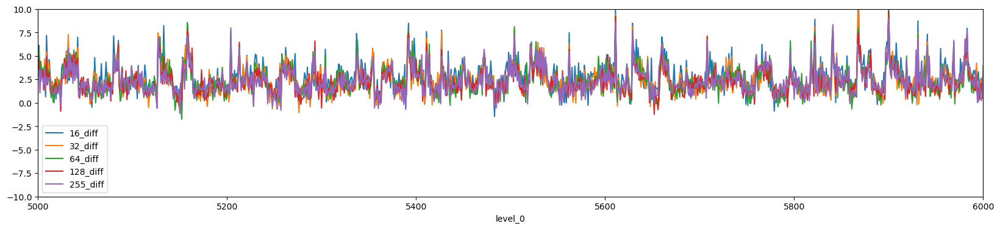

In [169]:
green_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=['16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

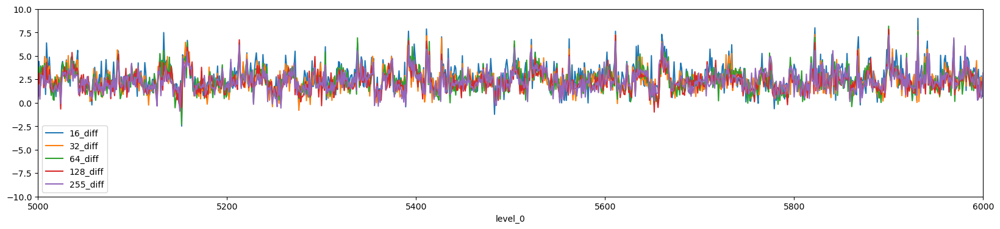

In [170]:
green_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=[ '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

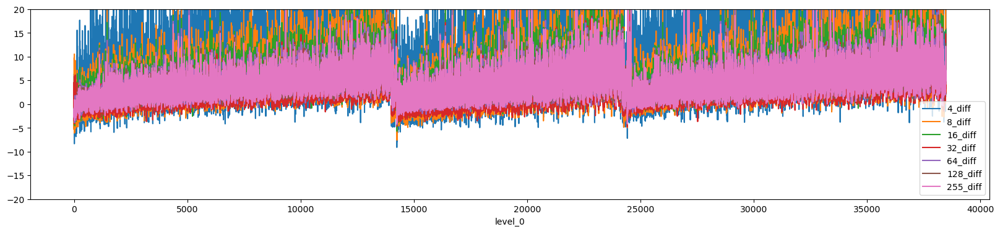

In [44]:
blue_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

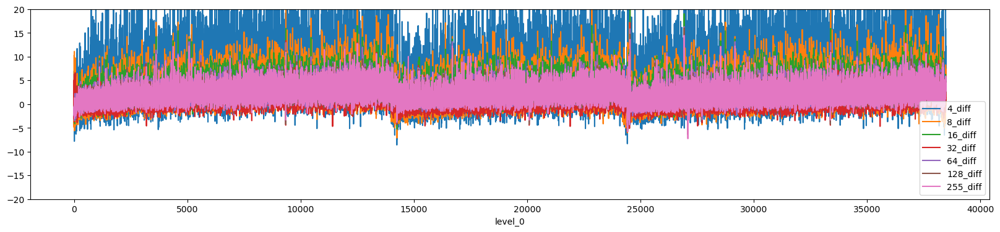

In [45]:
blue_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],x='level_0',ylim = [-20, 20], y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [46]:
print('all dots:', len(red_new_df))
print('overlap dots:', len(idxx))
 

all dots: 113985
overlap dots: 38488


In [47]:
print('red16 before')

print('mean', red_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['16_diff'].abs().std())

print()

print('red16 after')

print('mean', red_ol_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['16_diff'].abs().std())



red16 before
mean 4.140444714686969
standard deviation 3.3795135113206083

red16 after
mean 2.1724982923319374
standard deviation 1.7389931724925975


In [48]:
print('red32 before')

print('mean', red_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['32_diff'].abs().std())

print()

print('red32 after')

print('mean', red_ol_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['32_diff'].abs().std())



red32 before
mean 4.113159743177671
standard deviation 3.2931872489205936

red32 after
mean 2.150974378233397
standard deviation 1.687765228018356


In [49]:
print('red128 before')

print('mean', red_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['128_diff'].abs().std())

print()

print('red128 after')

print('mean', red_ol_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['128_diff'].abs().std())



red128 before
mean 4.0139217495492705
standard deviation 3.1272208541782502

red128 after
mean 2.093347072658905
standard deviation 1.5762708705473332


In [50]:
print('green16 before')

print('mean', green_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['16_diff'].std())

print()

print('green16 after')

print('mean', green_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('green32 before')

print('mean', green_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['32_diff'].std())

print()

print('green32 after')

print('mean', green_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('green128 before')

print('mean', green_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['128_diff'].std())

print()

print('green128 after')

print('mean', green_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['128_diff'].std())



green16 before
mean 3.927906182886688
standard deviation 4.275086388219221

green16 after
mean 2.6792013908714685


standard deviation 2.742383985352422


green32 before
mean 3.6279432371182403
standard deviation 4.136303663548461

green32 after
mean 2.4009273299608456
standard deviation 2.468665666151815


green128 before
mean 3.4011307209032604
standard deviation 4.086791308654599

green128 after
mean 2.1914741232460266
standard deviation 2.4510771386608314


In [51]:
print('blue16 before')

print('mean', blue_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['16_diff'].std())

print()

print('blue16 after')

print('mean', blue_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('blue32 before')

print('mean', blue_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['32_diff'].std())

print()

print('blue32 after')

print('mean', blue_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('blue128 before')

print('mean', blue_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['128_diff'].std())

print()

print('blue128 after')

print('mean', blue_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['128_diff'].std())



blue16 before
mean 5.293252857051242
standard deviation 3.6443914349416486

blue16 after
mean 3.102948788246681
standard deviation 2.2346036947686656


blue32 before
mean 3.2867942265603696
standard deviation 3.16848758166434

blue32 after
mean 1.2846411065902714
standard deviation 1.8862477541868454


blue128 before
mean 4.0326357313521735
standard deviation 2.8230132572555844

blue128 after
mean 2.1419623657969247
standard deviation 1.6692759558327035


/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='index', ylabel='[128_diff]'>

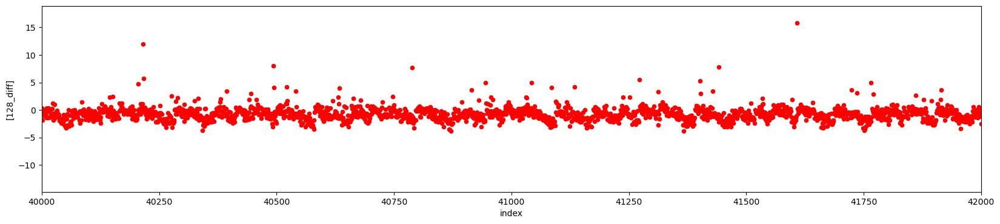

In [52]:
red_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='red')

<Axes: xlabel='index', ylabel='[128_diff]'>

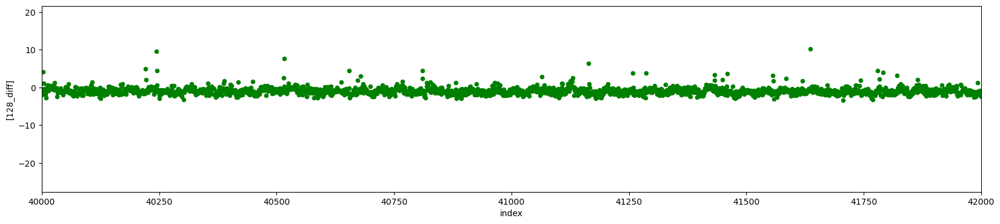

In [53]:
green_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='green')

<Axes: xlabel='index', ylabel='[128_diff]'>

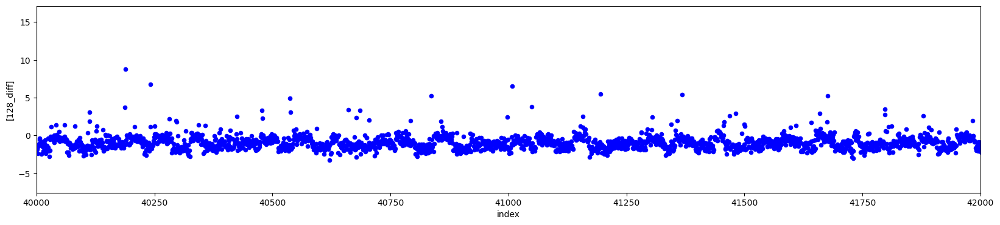

In [54]:
blue_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='blue')

In [178]:
print(red_ol_new_df['255_diff'].mean())


-0.0026237896454255993


In [176]:
len(idxx) / len(blue_ol_new_df)

0.3376703134732982

In [179]:
print(red_ol_new_df['255_diff'].mean())
print(red_ol_new_df['128_diff'].mean())
print(red_ol_new_df['64_diff'].mean())
print(red_ol_new_df['32_diff'].mean())
print(red_ol_new_df['16_diff'].mean())
print(red_ol_new_df['8_diff'].mean())
print(red_ol_new_df['4_diff'].mean())



-0.0026237896454255993
-0.0014921356661298211
0.00554046772071231
0.013760507736723954
0.05143484425549088
0.12931501828436318
0.3525084707020576


In [180]:
print(green_ol_new_df['255_diff'].mean())
print(green_ol_new_df['128_diff'].mean())
print(green_ol_new_df['64_diff'].mean())
print(green_ol_new_df['32_diff'].mean())
print(green_ol_new_df['16_diff'].mean())
print(green_ol_new_df['8_diff'].mean())
print(green_ol_new_df['4_diff'].mean())



-0.02575442816308712
-0.02534674713807491
-0.013667242045102005
0.0027101658507590835
0.060440268660910346
0.7981042547949008
0.2827747850966855


In [181]:
print(blue_ol_new_df['255_diff'].mean())
print(blue_ol_new_df['128_diff'].mean())
print(blue_ol_new_df['64_diff'].mean())
print(blue_ol_new_df['32_diff'].mean())
print(blue_ol_new_df['16_diff'].mean())
print(blue_ol_new_df['8_diff'].mean())
print(blue_ol_new_df['4_diff'].mean())



-0.0018692561077367689
-0.007679618351836126
-0.0013888989952578563
-0.05169568545671424
0.04917795018851781
-0.055709658270106155
0.4007134905366119


In [182]:
print((len(red_ol_new_df[red_ol_new_df['255_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['255_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['128_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['128_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['64_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['64_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['32_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['32_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['16_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['16_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['8_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['8_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['4_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['4_diff'] > 10])) / len(red_ol_new_df))

0.0005614773873755318
0.00045620037724261966
0.0005088388823090758
0.0006930736500416722
0.0008597622494187832
0.002649471421678291
0.015782778435759093


In [183]:
print((len(green_ol_new_df[green_ol_new_df['255_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['255_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['128_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['128_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['64_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['64_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['32_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['32_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['16_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['16_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['8_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['8_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['4_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['4_diff'] > 10])) / len(green_ol_new_df))

0.0023079893288402136
0.002369418702611626
0.0020973743330525135
0.0023255405784891885
0.0025537068239258635
0.10130581297388375
0.007626017972479641


In [184]:
print((len(blue_ol_new_df[blue_ol_new_df['255_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['255_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['128_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['128_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['64_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['64_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['32_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['32_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['16_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['16_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['8_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['8_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['4_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['4_diff'] > 10])) / len(blue_ol_new_df))

0.00031584211403654994
0.00017546784113141664
0.00030706872197997913
0.0007896052850913749
0.0011229941832410664
0.012809152402593414
0.047674612435405904


In [186]:
print(red_ol_new_df[(-10 < red_ol_new_df['255_diff']) & (red_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['128_diff']) & (red_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['64_diff']) & (red_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['32_diff']) & (red_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['16_diff']) & (red_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['8_diff']) & (red_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['4_diff']) & (red_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.009176436683579564
-0.00661509948075019
-0.00019789254304712148
0.005877993919487247
0.04140041038744286
0.09654577330592574
0.14512772860515208


In [187]:
print(green_ol_new_df[(-10 < green_ol_new_df['255_diff']) & (green_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['128_diff']) & (green_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['64_diff']) & (green_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['32_diff']) & (green_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['16_diff']) & (green_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['8_diff']) & (green_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['4_diff']) & (green_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

0.013392410326385835
0.005332653945922657
0.00641545799619784
0.02779167718986666
0.0903319634767543
1.6876233003969565
0.2526219813514858


In [188]:
print(blue_ol_new_df[(-10 < blue_ol_new_df['255_diff']) & (blue_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['128_diff']) & (blue_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['64_diff']) & (blue_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['32_diff']) & (blue_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['16_diff']) & (blue_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['8_diff']) & (blue_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['4_diff']) & (blue_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.0053722383130357446
-0.00970369903658421
-0.004950904346863766
-0.0608687334616237
0.036222784046238854
-0.22173818618900518
-0.2848379568949101
